# Exercise 4
### Group "21stCenturyBoys": Mattia Ceravolo, Lorenzo Borella, Samuele Lipani, Marco Giunta.

# Part 1


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib
import seaborn as sns

from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler

from mpl_toolkits import mplot3d
from mpl_toolkits.mplot3d import Axes3D
from collections import OrderedDict

### Loading the data

In [2]:
fname = "data_t-SNE_310101_d5_R100_e1_N800.dat"

#data
x = np.loadtxt(fname)

#number of total samples
N = x.shape[0]

#number of samples in each cluster
n0 = int(0.1*N) 
n1 = int(0.3*N) 
n2 = int(0.6*N)

#label array for each sample
labels = np.zeros(N)
labels[n0:n0+n1] = 1
labels[n0+n1:N] = 2

print(f"\nData Shape: (n. samples, d) = {x.shape} \nCluster 1 size: {n0} \nCluster 2 size: {n1} \nCluster 3 size: {n2} ")


Data Shape: (n. samples, d) = (800, 5) 
Cluster 1 size: 80 
Cluster 2 size: 240 
Cluster 3 size: 480 


### Apply TSNE

We apply TSNE to reduce the dimensionality of the dataset and we represent them in 3D and 2D with different values of perplexities; in particular we first plot a 3D TSNE with a single value of the perplexity to gain some qualitative insight, then we perform more sistematic plots with a 2D TSNE with multiple perplexity values.

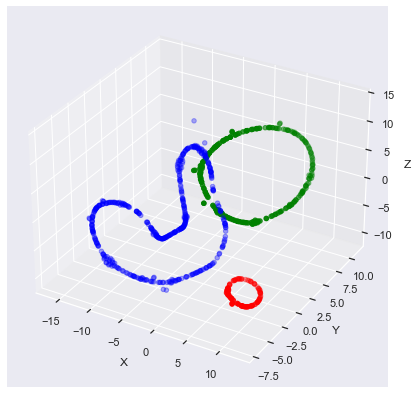

In [3]:
#3D TSNE
x_embedded = TSNE(n_components=3,perplexity=30.0,random_state=1122).fit_transform(x) #perplexity=30.0 is the default value, 
# but I'm still explicitly writing it since it's actually a good value for our data (see below)

#static 3D plot
sns.set(style = "darkgrid")
fig = plt.figure(figsize=(7,7))
ax = fig.add_subplot(111, projection = '3d')

X = x_embedded[:,0]
Y = x_embedded[:,1]
Z = x_embedded[:,2]

ax.set_xlabel("X")
ax.set_ylabel("Y")
ax.set_zlabel("Z")
ax.scatter3D(X[:n0], Y[:n0], Z[:n0], c='red')
ax.scatter3D(X[n0:n0+n1], Y[n0:n0+n1], Z[n0:n0+n1], c='green')
ax.scatter3D(X[n0+n1:], Y[n0+n1:], Z[n0+n1:], c='blue')

# Note: 3d tsne yields a couple of points which are very far from the others, and as such the resulting plot will have large axes limits i.e. it will be very zoomed out. 
# By default, therefore, we cut those points out by reducing the axes limits. If one wishes to see every point it's enough to set the following flag equal to True

show_far_away_points = False

if show_far_away_points is True :
    ax.set_xlim3d((X.min()-1), (X.max()+1))
    ax.set_ylim3d((Y.min()-1), (Y.max()+1))
    ax.set_zlim3d((Z.min()-1), (Z.max()+1))
else :
    ax.set_xlim3d(-18, 14)
    ax.set_ylim3d(-8,12)
    ax.set_zlim3d(-12,15)

plt.show()

The previous 3D plot is static and therefore not very informative; below we plot the same data with an interactive graph using the `plotly` library. If `plotly` is not installed please either execute the next cell, or avoid running the interactive plot cell altogether.

In [4]:
!pip install plotly #Windows command, modify accordingly

In [5]:
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook
plotly.offline.init_notebook_mode()

# Configure our 3 traces
trace_0 = go.Scatter3d(
    x = X[:n0],
    y = Y[:n0],
    z = Z[:n0],
    mode = 'markers',
    marker = {
        'size': 5,
        'opacity': 0.8,
        'color': 'red'
    },
    name = 'Label = 0'
)

trace_1 = go.Scatter3d(
    x = X[n0:n0+n1],
    y = Y[n0:n0+n1],
    z = Z[n0:n0+n1],
    mode = 'markers',
    marker = {
        'size': 5,
        'opacity': 0.8,
        'color': 'green'
    },
    name = 'Label = 1'
)

trace_2 = go.Scatter3d(
    x = X[n0+n1:],
    y = Y[n0+n1:],
    z = Z[n0+n1:],
    mode = 'markers',
    marker = {
        'size': 5,
        'opacity': 0.8,
        'color': 'blue'
    },
    name = 'Label = 2'
)

# Configure the layout
if show_far_away_points is False :
    layout = go.Layout(
        margin = {'l': 0, 'r': 0, 'b': 0, 't': 0},
        scene = {'xaxis': dict(range = [-18, 14]), 'yaxis': dict(range = [-8,12]), 'zaxis': dict(range = [-12,15])}
    )
else :
    layout = go.Layout(
        margin = {'l': 0, 'r': 0, 'b': 0, 't': 0}
    )    

data = [trace_0, trace_1, trace_2]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot
plotly.offline.iplot(plot_figure)

Now we apply 2D t-SNE with 4 different values of the perplexity parameter (as suggested in the PDF).

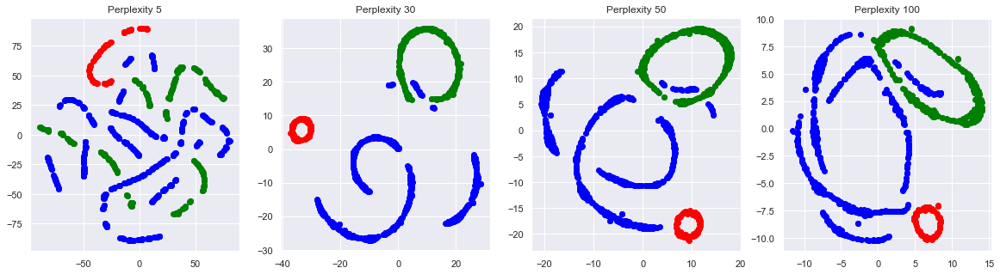

In [6]:
#2d representations with different perplexities
perplexities = [5,30,50,100]

fig, ax = plt.subplots(nrows=1, ncols=4,figsize=(20,5))

for i in range(len(perplexities)):
    x_embedded = TSNE(n_components=2,perplexity=perplexities[i],random_state=1234).fit_transform(x) 
    ax[i].scatter(x_embedded[:n0,0],x_embedded[:n0,1],color='red')
    ax[i].scatter(x_embedded[n0:n0+n1,0],x_embedded[n0:n0+n1,1],color='green')
    ax[i].scatter(x_embedded[n0+n1:,0],x_embedded[n0+n1:,1],color='blue')
    ax[i].set_title(f"Perplexity {perplexities[i]}")

plt.show()

### Statistical analysis of distances between neighboring points
We now come back to the original 5D dataset and compute the distances between each point and its closest neighbour; this is potentially interesting in and of itself, but we mainly do it to compute the eps0 parameter to be used in DBSCAN.

Approximate most common distance between neighboring points: 4507.5
Mean distance between neighboring points: 5256.15


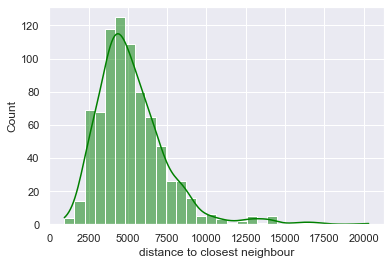

In [7]:
# there are multiple ways to tackle this problem; here we do the following. We iterate over each sample and subtract it from the matrix representing the original dataset; the result is a matrix such that each row is the vector difference between our sample and every other else, therefore computing the norm of each row yields a 1D array each element thereof is the desired distance. We can't naively use np.min() with the resulting array, though, since the element corresponding to the difference between our sample and itself will be automatically zero and prevent us from obtaining the true minimum (and even if we didn't need the minimum this distance is clearly useless, so removing it is a good idea in any case). A simple solution to this is to set equal to NaN the null distance and then use np.nanmin() instead of np.min(); another solution may be to apply np.sort() to the vector containing the distances and save the second element, but this is probably more computationally expensive.

# we define a function because we'll need this again later
def find_distances_between_neighbours(points,norm_order=1) : #by experimenting a bit we found that the L1 norm here works best
    N = points.shape[0] #number of samples in dataset
    distances_vector = np.zeros((N,))

    for i in range(N) :
        distances = np.linalg.norm((x - x[i]), ord=norm_order, axis=1)
        distances[i] = np.nan
        distances_vector[i] = np.nanmin(distances)
        
    return distances_vector

distance_to_closest_neighbour_array = find_distances_between_neighbours(x)

n_bins = 30
# plt.hist(distance_to_closest_neighbour_array, bins=n_bins);
# plt.ylabel("Counts")
sns.histplot(distance_to_closest_neighbour_array,kde=True,bins=n_bins,color="green");
plt.xlabel("distance to closest neighbour");
# plt.show()

def compute_mode(d,nb=n_bins) :
    (hist_array,bin_edges) = np.histogram(d,bins=nb)
    return np.mean([bin_edges[np.argmax(hist_array)],bin_edges[np.argmax(hist_array)+1]])

mode_distance = compute_mode(distance_to_closest_neighbour_array)
print("Approximate most common distance between neighboring points:", mode_distance)
mean_distance = np.mean(distance_to_closest_neighbour_array)
print("Mean distance between neighboring points:", mean_distance)

We can easily notice that the obtained distribution is almost symmetric except for a small tail on the right; this explains why the mean and mode values are (relatively) close, and why we can use either as an estimate for eps0.

In [8]:
eps0 = mode_distance #the mean is fine, too
print(eps0)

### DBSCAN

We now use DBSCAN to cluster the data points in 5D.

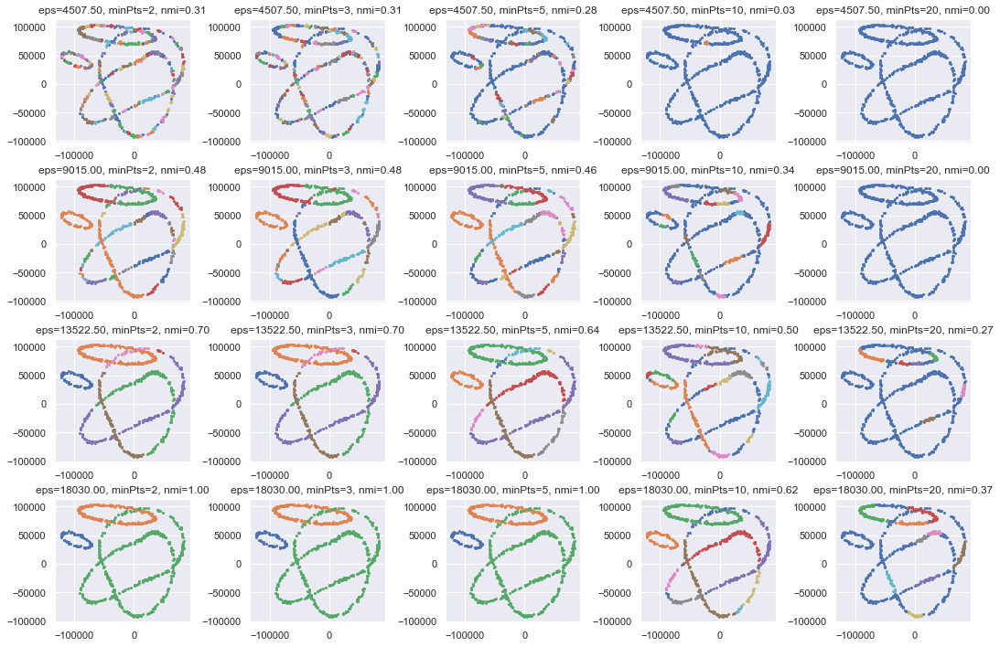

In [11]:
# adapted from NB15
mycol = ["k", "r", "g", "b", "y"]
cmap = ListedColormap(mycol)

def NMI(y_true, y_pred):
    """ Computes normalized mutual information: where y_true and y_pred are both clustering assignments
    """
    w = clustering(y_true)
    c = clustering(y_pred)
    n_sample = len(y_true)

    Iwc = 0.
    for kw in w.keys():
        for kc in c.keys():
            w_intersect_c=len(set(w[kw]).intersection(set(c[kc])))
            if w_intersect_c > 0:
                Iwc += w_intersect_c*np.log(n_sample*w_intersect_c/(len(w[kw])*len(c[kc])))
    Iwc/=n_sample
    Hc = entropy(c,n_sample)
    Hw = entropy(w,n_sample)

    return 2*Iwc/(Hc+Hw)

def entropy(c, n_sample):
    # Measures the entropy of a cluster
    h = 0.
    for kc in c.keys():
        p=len(c[kc])/n_sample
        h+=p*np.log(p)
    h*=-1.
    return h

def clustering(y):
    # Finds position of labels and returns a dictionary of cluster labels to data indices.
    yu = np.sort(np.unique(y))
    clustering = OrderedDict()
    for ye in yu:
        clustering[ye] = np.where(y == ye)[0]
    return clustering

def plotting_ax(X, y, ax):
    # plotting function
    for i, yu in enumerate(np.unique(y)):
        pos = (y == yu)
        ax.scatter(X[pos,0], X[pos,1],s=4)

X, ytrue = x, labels

#set of parameters
eps_range = eps0*np.arange(1,5)
min_sample_range = [2,3,5,10,20]

fig, ax = plt.subplots(len(eps_range),len(min_sample_range),figsize=(15,10))
for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_sample_range):
        model = DBSCAN(eps=eps, min_samples=min_samples)
        model.fit(X)
        y = model.labels_
        plotting_ax(X,y,ax[i,j])
        nmi = NMI(y, ytrue)
        ax[i,j].set_title('eps=%.2f, minPts=%i, nmi=%.2f'%(eps,min_samples,nmi))

plt.tight_layout(h_pad=0.5)
plt.show()

Now we perform the same clustering via DBSCAN (using the same grid, too), but this time before plotting we "project" the data in 2D via t-SNE, and then plot the colors according to the labels predicted by the 5D DBSCAN.

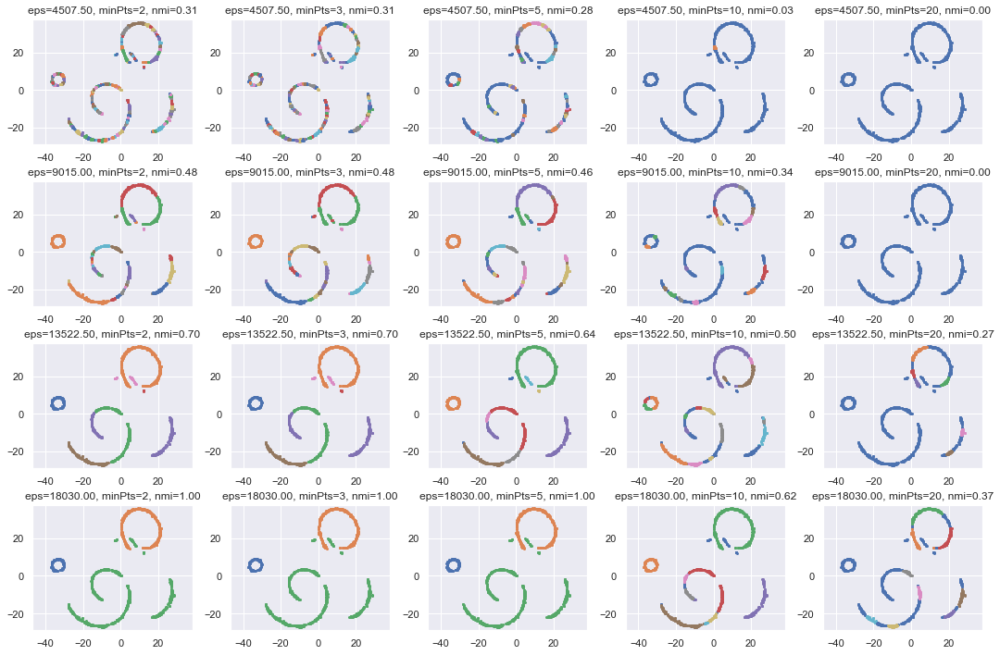

In [12]:
x_embedded = TSNE(n_components=2,perplexity=30,random_state=1234).fit_transform(x)
X = x
eps_range = eps0*np.arange(1,5)
min_sample_range = [2,3,5,10,20]

fig, ax = plt.subplots(len(eps_range),len(min_sample_range),figsize=(15,10))
for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_sample_range):
        model = DBSCAN(eps=eps, min_samples=min_samples)
        model.fit(X)
        y = model.labels_
        plotting_ax(x_embedded,y,ax[i,j])
        nmi = NMI(y, ytrue)
        ax[i,j].set_title('eps=%.2f, minPts=%i, nmi=%.2f'%(eps,min_samples,nmi))
        ax[i,j].axis("equal");

plt.tight_layout(h_pad=0.5)
plt.show()

# Part 2

In [13]:
file_name_x = "DATA/x_M5_N400.csv"
file_name_y = "DATA/y_M5_N400.csv"

x = np.loadtxt(file_name_x,dtype="int", delimiter=" ")
y = np.loadtxt(file_name_y,dtype="int", delimiter=" ")

## t-SNE algorithm

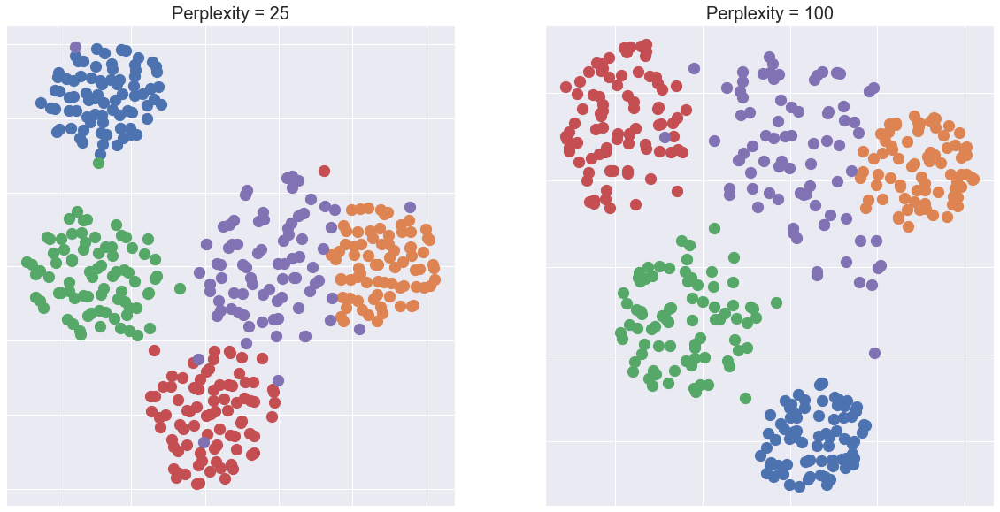

In [14]:
perplexities = [25, 100]

fig, ax = plt.subplots(nrows=1,ncols=2,figsize=(20,10))
for i in range(2) :
    x_embedded = TSNE(n_components=2, perplexity=perplexities[i], random_state=1234).fit_transform(x)
    for j in range(5):
        ax[i].scatter(x_embedded[:,0][np.where(y==j)],x_embedded[:,1][np.where(y==j)], s=150);
    ax[i].set_yticklabels([])
    ax[i].set_xticklabels([])
    ax[i].axis("equal");
    ax[i].set_title(f"Perplexity = {perplexities[i]}", fontsize=20)

We notice that by changing the perplexity value the same clustering pattern remains, but the dataset points are rotated.

In [15]:
# our choice of perplexity for tsne
x_emb = TSNE(n_components=2, perplexity=25, random_state=1234).fit_transform(x)

## Distances between each pair of clusters

From the patterns of the generation of samples we see that certain labels, y, are assigned when particular conditions happens in the data. Those conditions concern the presence or not in the sample of a determined list of numbers. We see that only for the labels 1 and 4 there are 4 common numbers in the sequence of the patterns that make the samples belonging to $y=1$ and $y=4$ similar in terms of distance of clusters. Indeed we will see that the minimum distance of points between clusters is achieved between group 1 and 4. 

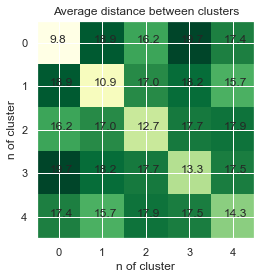

In [16]:
dis_matrix = np.zeros((5,5))

for i in range(5):
    for j in range(5):
        distance = []
        for k in x[np.where(y==i)]: 
            for z in x[np.where(y==j)]: 
                distances = np.sum(np.abs(z-k))
                distance.append(distances)

        dis_matrix[i,j] = np.mean(distance)
        
plt.imshow(dis_matrix, cmap = 'YlGn')
plt.title('Average distance between clusters')
plt.xlabel('n of cluster')
plt.ylabel('n of cluster')
plt.xticks(range(0,5))
plt.yticks(range(0,5))

for i in range(5):
    for j in range(5):
        plt.text(i-0.2,j, round(dis_matrix[i,j],1))

By inspecting the above matrix we notice that the average distance between points with label 4 and points with label 1 (computed in 36 dimensions) is the smallest one.

# DBSCAN algorithm

## Visualizing minimum distances

In [17]:
distance = []

for i in range(len(x)): 
    all_x = list(x)
    del all_x[i]
    distances = np.sum(np.abs(all_x-np.array(x[i])), axis=1)
    distance.append(np.min(distances))

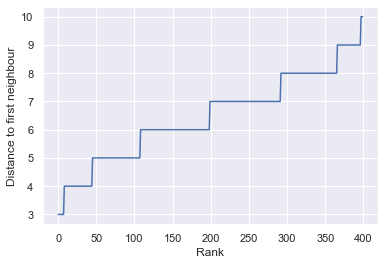

In [18]:
plt.plot(np.sort(distance));
plt.xlabel('Rank');
plt.ylabel('Distance to first neighbour');

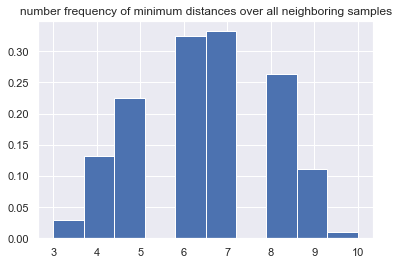

In [19]:
plt.hist(distance, density=True);
plt.title('number frequency of minimum distances over all neighboring samples');

If we plot the different minimum distances of each point from its nearest neighbour we notice that:

- in the first plot (which was suggested we do in the PDF) the width of each step represents the number of points that achieve the same distance from their neighbours. The advised choice of $\varepsilon$ for DBSCAN would be roughly the value corresponding to the larger step; 

- from the second plot we can directly infer by inspection the mode of the histogram, which is now used to estimate $\varepsilon$ instead of the step width seen in the previous graph.

We therefore expect that a good value of $\varepsilon$ is $\approx$ 7.

## Clustering with DBSCAN in 36 dimensions

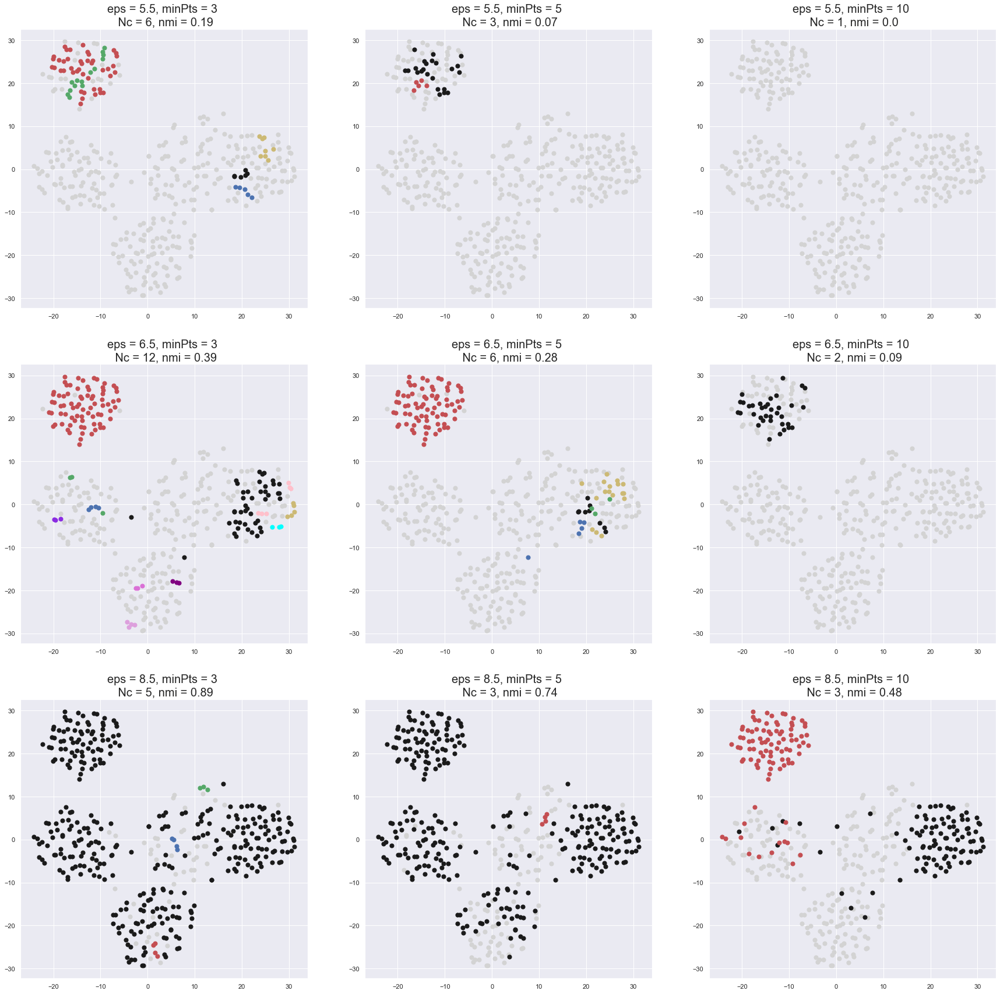

In [20]:
epsilon = [5.5,6.5,8.5]
# we decide to compare different values around 7, the cutoff one found before
minsample = [3, 5, 10]
mycol=['lightgray','k','r','g','b','y','orchid','pink','plum','cyan','blueviolet','purple']

fig, ax = plt.subplots(nrows=3,ncols=3,figsize=(30,30))
for i in range(len(epsilon)):
    for j in range(len(minsample)):
        db = DBSCAN(eps=epsilon[i], min_samples=minsample[j], metric = 'l1').fit(x)
        y_predict = db.fit_predict(x)
        y_values = np.unique(y_predict)
        nmi = np.round(1 - (y_predict == -1).sum()/len(y_predict),2)
        for k in range(len(y_values)):
            ax[i,j].scatter(x_emb[:,0][np.where(y_predict == y_values[k])], x_emb[:,1][np.where(y_predict == y_values[k])], c=mycol[k], s=50)
            ax[i,j].set_title(f"eps = {epsilon[i]}, minPts = {minsample[j]} \n Nc = {len(y_values)}, nmi = {nmi}", fontsize = 20)

## What's going on?
We first used the x_embedded samples in two dimensions to represent the clusters obtained through DBSCAN algorithm in 36 dimensions. We see that performance of DBSCAN in the high dimensional feature space is not optimal since the number of clusters recognized while changing the parameters doesn't correspond to the already known labelled ones. 
Even though with DBSCAN we don't obtain a satisfying distribution of clusters t-SNE works differently - and thus allows for better results.

Indeed if we first reduce dimensionality and only then apply DBSCAN clustering results are better; t-SNE performs a comparison between distances of points in feature space such that points that are far away from each other are made even more distant while the ones close to each other are made closer.

We therefore think that the reason why DBSCAN doesn't work is the metric used; DBSCAN in two dimensions after dimensionality reduction (t-SNE) is indeed like exploiting the properties of a different new metrics that in this case works better.

### DBSCAN in 2D space

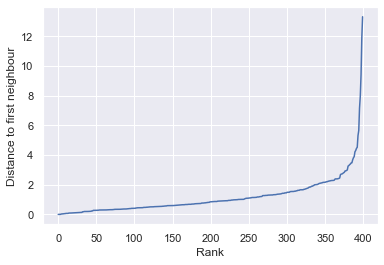

In [21]:
# distance in the 2D space

distance_2d = []

for i in range(len(x_emb)): 
    all_x = list(x_emb)
    del all_x[i]
    distances = np.sum((all_x-np.array(x_emb[i]))**2, axis=1)
    distance_2d.append(np.min(distances))
    
plt.plot(np.sort(distance_2d));
plt.xlabel('Rank');
plt.ylabel('Distance to first neighbour');

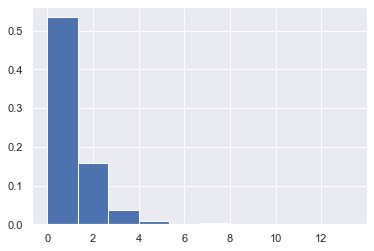

In [22]:
plt.hist(distance_2d, density=True);

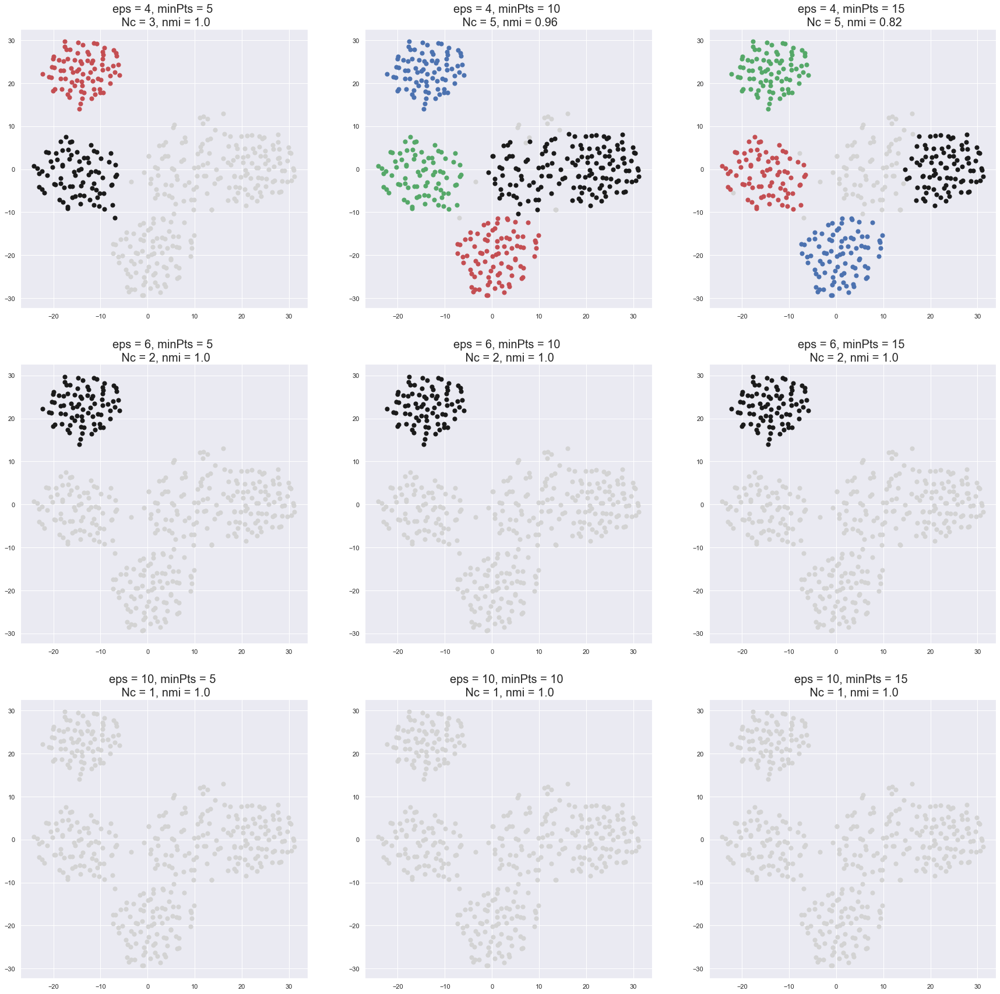

In [23]:
epsilon = [4, 6, 10]
# we choose instead of the suggested 1-2 a bigger value to ensure a reasonable number of points in each cluster
minsample = [5, 10, 15]
mycol=['lightgray','k','r','g','b','y','orchid','pink','plum','cyan','blueviolet','purple']

fig, ax = plt.subplots(nrows=3,ncols=3,figsize=(30,30))
for i in range(len(epsilon)):
    for j in range(len(minsample)):
        db = DBSCAN(eps=epsilon[i], min_samples=minsample[j], metric = 'l2').fit(x_emb)
        y_predict = db.fit_predict(x_emb)
        y_values = np.unique(y_predict)
        nmi = np.round(1 - (y_predict == -1).sum()/len(y_predict),2)
        for k in range(len(y_values)):
            ax[i,j].scatter(x_emb[:,0][np.where(y_predict == y_values[k])], x_emb[:,1][np.where(y_predict == y_values[k])], c=mycol[k], s=50)
            ax[i,j].set_title(f"eps = {epsilon[i]}, minPts = {minsample[j]} \n Nc = {len(y_values)}, nmi = {nmi}", fontsize = 20)

We notice that for large epsilon DBSCAN groups points in a single large cluster independently of the minPts parameter.    
We also notice that if epsilon is set equal to 4 (the optimal value we've chosen) the density-based nature of the DBSCAN algorithm clearly emerges if we gradually increase the minPts parameter; indeed once we get to the third graph the big black cluster appearing in the previous plot splits in 2 "sub-clusters" such that the new black cluster is denser than the other one.

As we were expecting in the previous section of the notebook, visualizing the data in 2D they are more easily grouped in clusters and so we found a set of parameters that properly let the algorithm classify the data. 